<IPython.core.display.Javascript object>


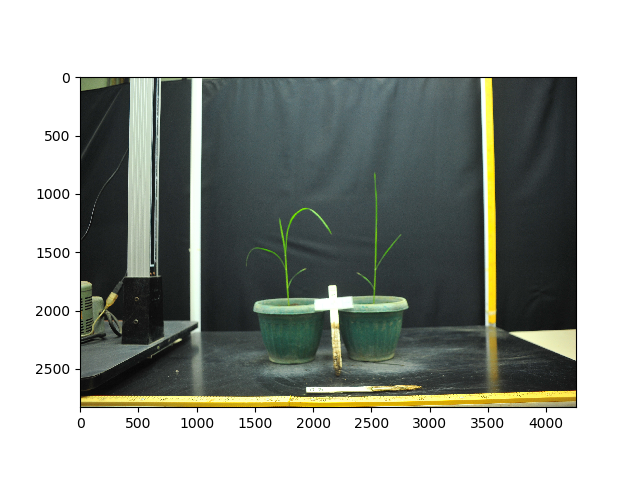

In [28]:
from plantcv import plantcv as pcv
import cv2 
import numpy as np
import matplotlib
pcv.params.debug= 'plot'

# Workflow works on these images (at least mostly)
# img, path, filename = pcv.readimage("GN2_5525.JPG")
# img, path, filename = pcv.readimage("GN2_5519.JPG") <- right plant is a little funky
# img, path, filename = pcv.readimage("GN2_5520.JPG") #Green pot doesn't work 
img, path, filename = pcv.readimage("GN2_5532.JPG")

# GOALS:
# measure culm
# measure longest leaf 
# leaf count
# tiller count 

In [3]:
# Still need testing 

# img, path, filename = pcv.readimage("GN2_5523.JPG")
# img, path, filename = pcv.readimage("GN2_5524.JPG")
# img, path, filename = pcv.readimage("GN2_5527.JPG)
# img, path, filename = pcv.readimage("GN2_5528.JPG")
# img, path, filename = pcv.readimage("GN2_5530.JPG")
# img, path, filename = pcv.readimage("GN2_5531.JPG")
# img, path, filename = pcv.readimage("GN2_5532.JPG)
# img, path, filename = pcv.readimage("GN2_5533.JPG")
# img, path, filename = pcv.readimage("GN2_5535.JPG")


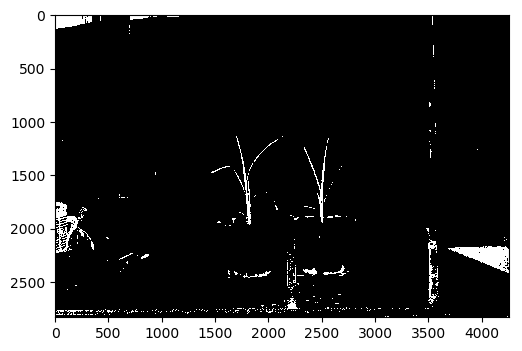

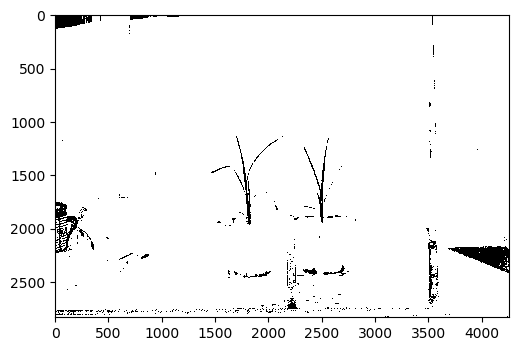

In [23]:
%matplotlib inline
mask = pcv.naive_bayes_classifier(img, pdf_file="naive_bayes_leaf_angle.txt")

<IPython.core.display.Javascript object>


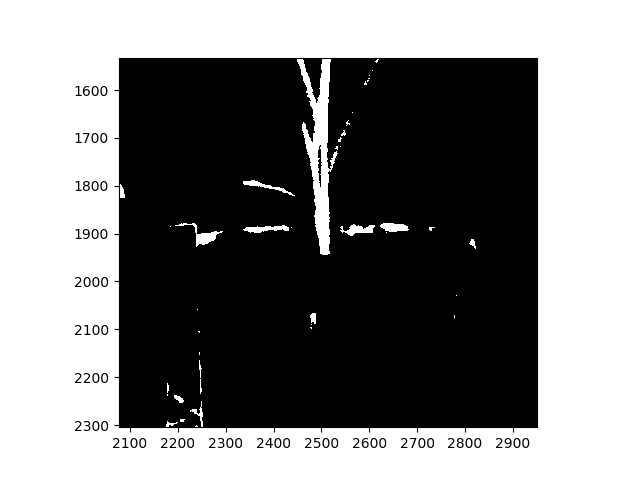

In [20]:
%matplotlib notebook
%matplotlib notebook  
%matplotlib notebook
pcv.plot_image(mask["plant"])

<IPython.core.display.Javascript object>


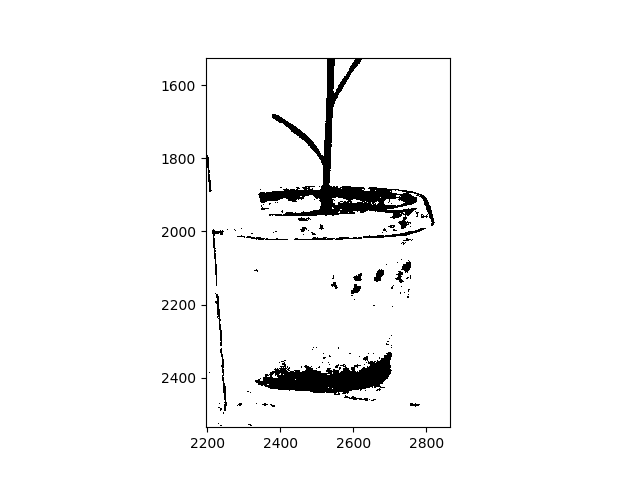

In [29]:
mask = pcv.naive_bayes_classifier(img, pdf_file="rice_nb__pdfs.txt")


<IPython.core.display.Javascript object>


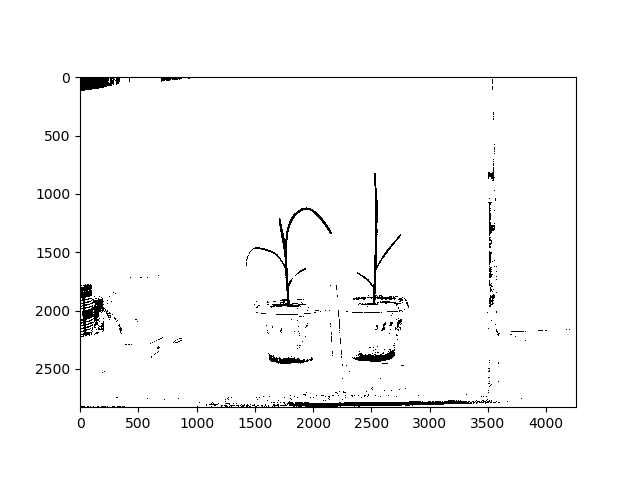

In [30]:

mask = pcv.naive_bayes_classifier(img, pdf_file="rice_v3_pdfs.txt")


<IPython.core.display.Javascript object>


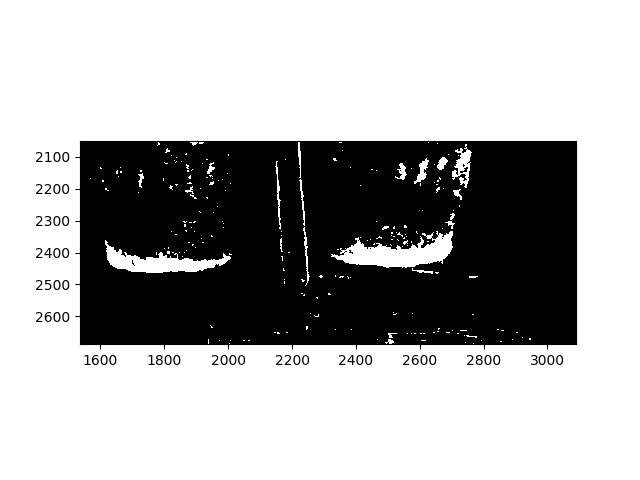

In [33]:
%matplotlib notebook
%matplotlib notebook  
%matplotlib notebook
pcv.plot_image(mask["plant"])

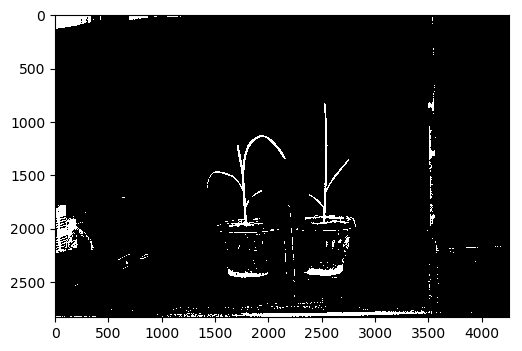

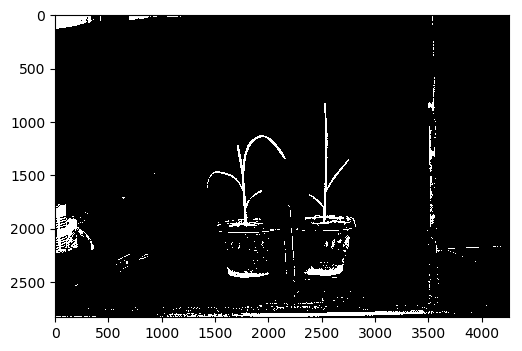

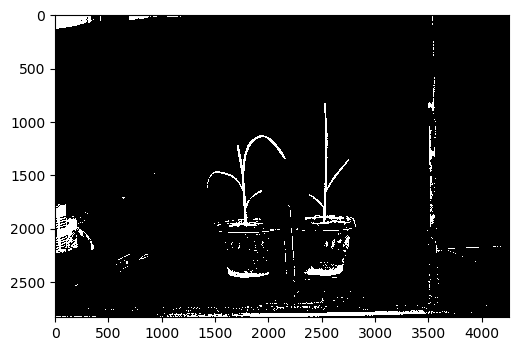

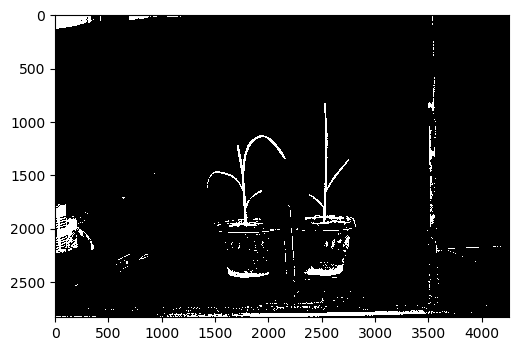

In [32]:
%matplotlib inline
a_thresh_img = pcv.closing(gray_img=mask["plant"])
a_thresh_img = pcv.dilate(gray_img=a_thresh_img, ksize=2, i=1)
a_thresh_img = pcv.closing(gray_img=a_thresh_img)
a_thresh_img = pcv.closing(gray_img=a_thresh_img)

<IPython.core.display.Javascript object>


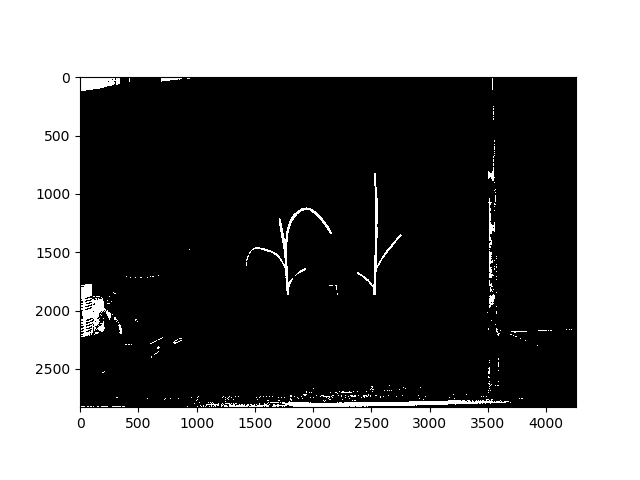

In [41]:
rectangle = pcv.rectangle_mask(img=a_thresh_img, p1=(1370,1875), p2=(3000,2600))

<IPython.core.display.Javascript object>


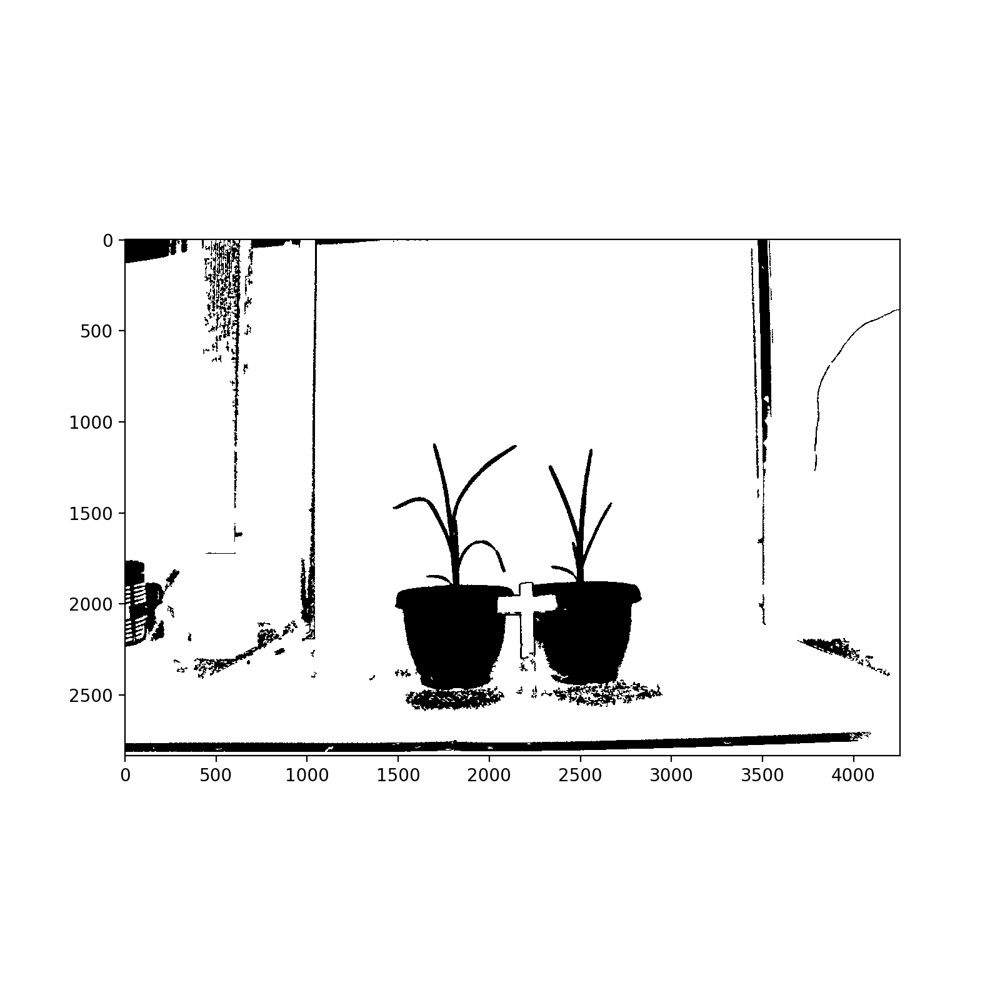

In [137]:
import matplotlib
%matplotlib notebook
%matplotlib notebook  
%matplotlib notebook  

matplotlib.rcParams["figure.figsize"] = [8,8]

filled_img = pcv.fill(bin_img=a_thresh_img, size=300)
filled_img = ~pcv.fill(bin_img=~filled_img, size=50)

<IPython.core.display.Javascript object>


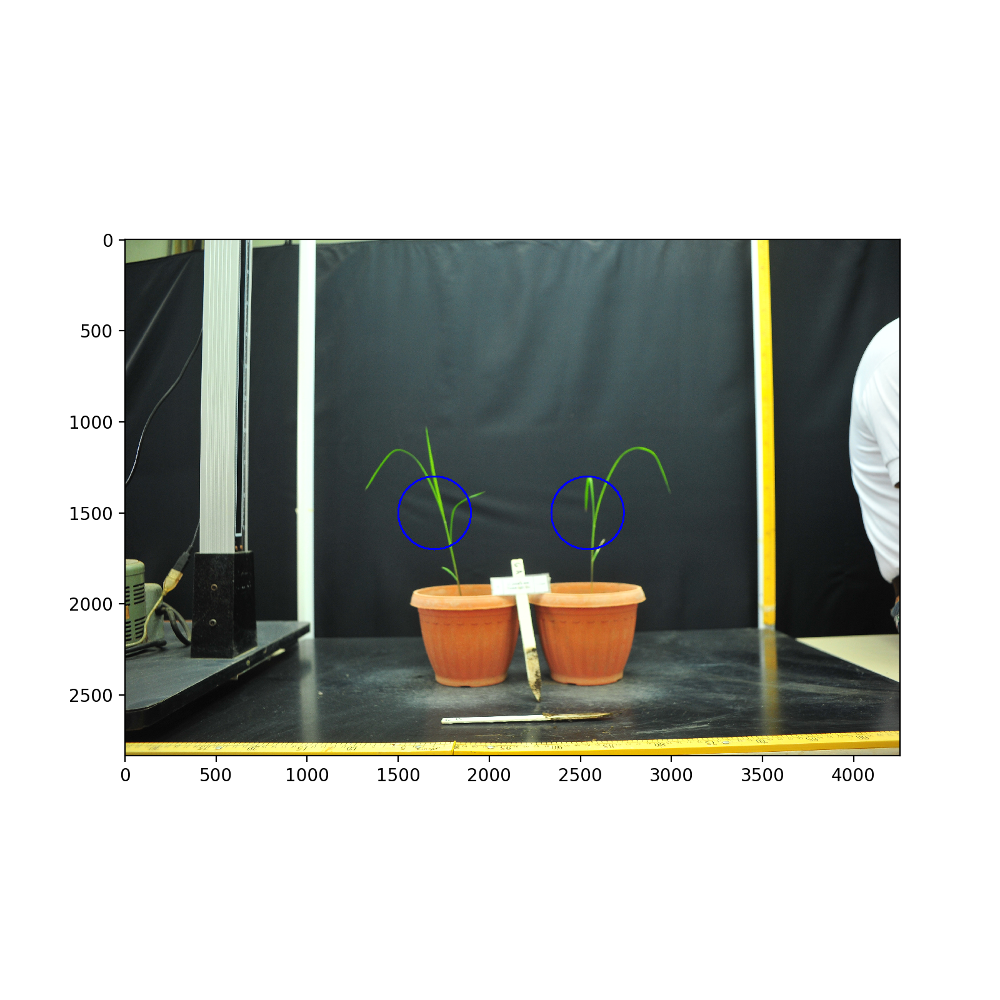

In [115]:
pcv.params.line_thickness = 10
rois, roi_hierarchies = pcv.roi.multi(img=img, coord=[(1700,1500), (2540,1500)], 
                                      radius=200)

## This is where the workflow splits off

<IPython.core.display.Javascript object>


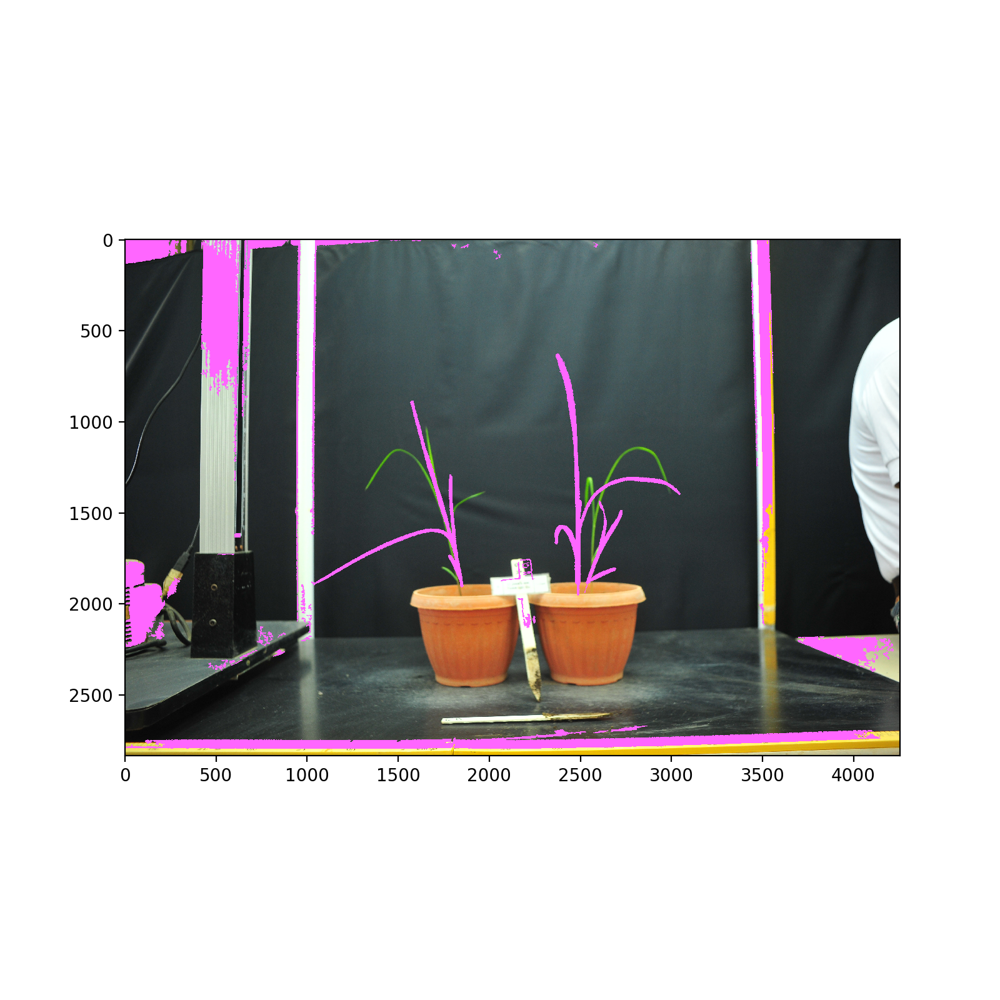

In [131]:
obj, obj_hierarchy = pcv.find_objects(img=img, mask=filled_img)

# First plant

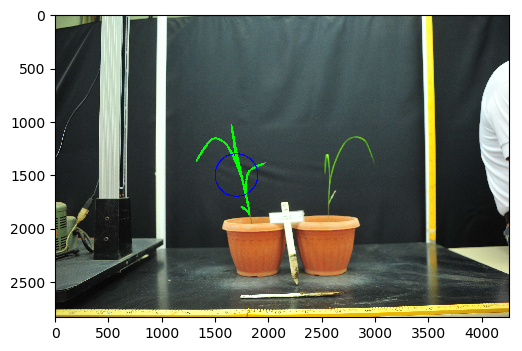

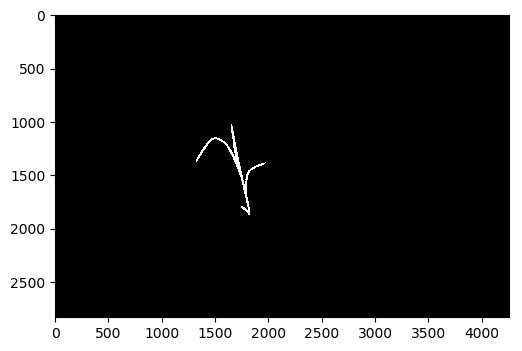

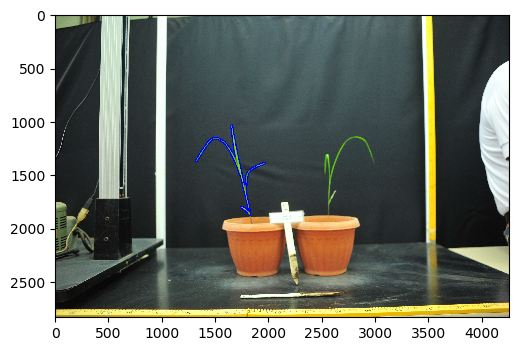

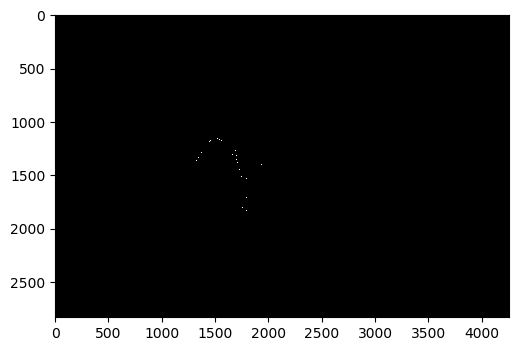

In [80]:
%matplotlib inline

filtered_contours1, filtered_hierarchy1, filtered_mask1, filtered_area1 = pcv.roi_objects(
        img=img, roi_type="partial", roi_contour=rois[0], roi_hierarchy=roi_hierarchies[0], object_contour=obj, 
        obj_hierarchy=obj_hierarchy)
plant_contour1, plant_mask1 = pcv.object_composition(img=img, contours=filtered_contours1, 
                                                     hierarchy=filtered_hierarchy1)        
skel1 = pcv.morphology.skeletonize(mask=filtered_mask1)


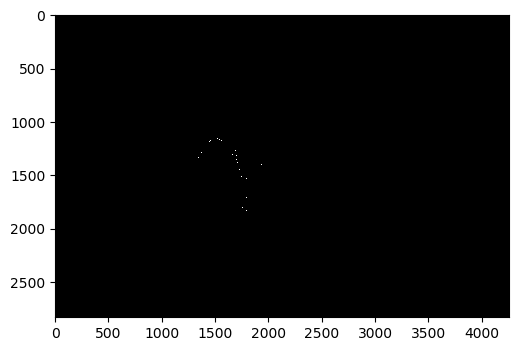

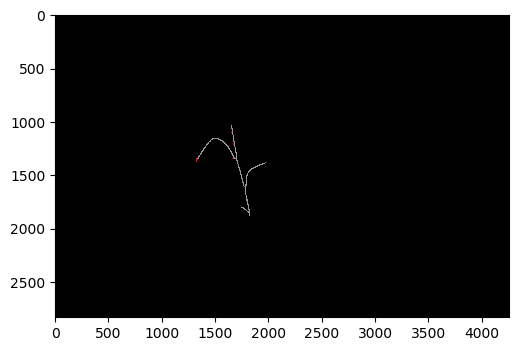

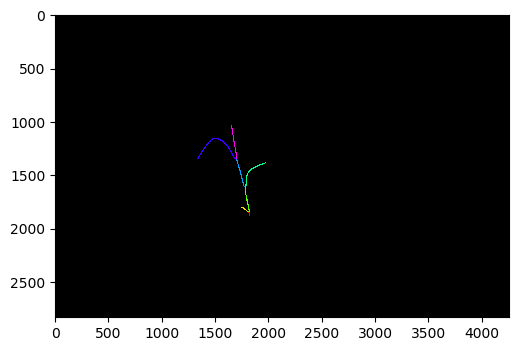

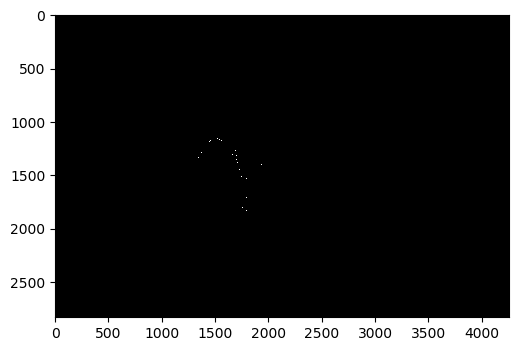

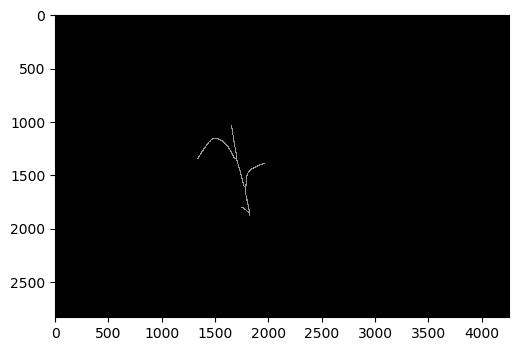

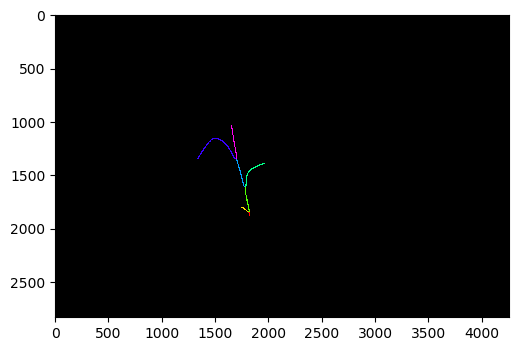

In [81]:
%matplotlib inline

pruned1, segmented_img, segment_objects = pcv.morphology.prune(skel1, 40)
pruned1, segmented_img, segment_objects = pcv.morphology.prune(pruned1, 30)


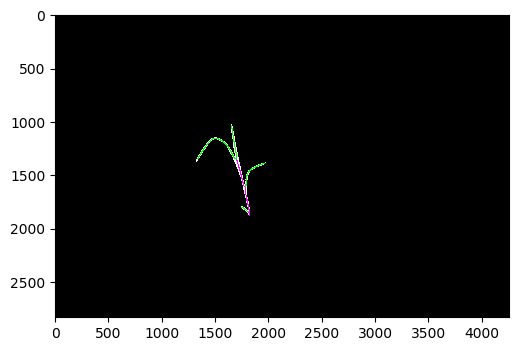

In [82]:
leaf_objects1, other_objects1 = pcv.morphology.segment_sort(skel_img=pruned1, 
                                                            objects=segment_objects, 
                                                            mask=filtered_mask1)

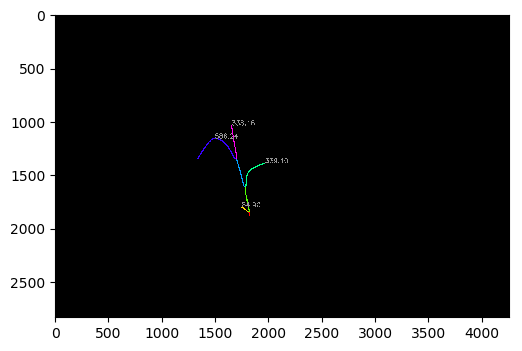

In [83]:
pcv.params.text_size=2
pcv.params.text_thickness = 5
labeled_img = pcv.morphology.segment_path_length(segmented_img=segmented_img, objects=leaf_objects1)


In [12]:
leaf_lengths = pcv.outputs.observations['segment_path_length']['value']
max(leaf_lengths)

In [ ]:
# Add measurement of the number of leaves 
if i == 0:
    plant_label = "left"
else: 
    plant_label = "right"
pcv.outputs.add_measurement(variable='number_of_leaves', trait='number_of_leaves',
                            method='plantcv.plantcv.morphology.segment_sort', scale='none', datatype=int,
                            value=len(leaf_objects1), label=plant_label)

pcv.outputs.add_measurement(variable='longest_leaf_length', trait='longest_leaf_length',
                            method='plantcv.plantcv.morphology.segment_sort', scale='none', datatype=int,
                            value=max(leaf_lengths), label=plant_label)

# Second plant (right)

<IPython.core.display.Javascript object>


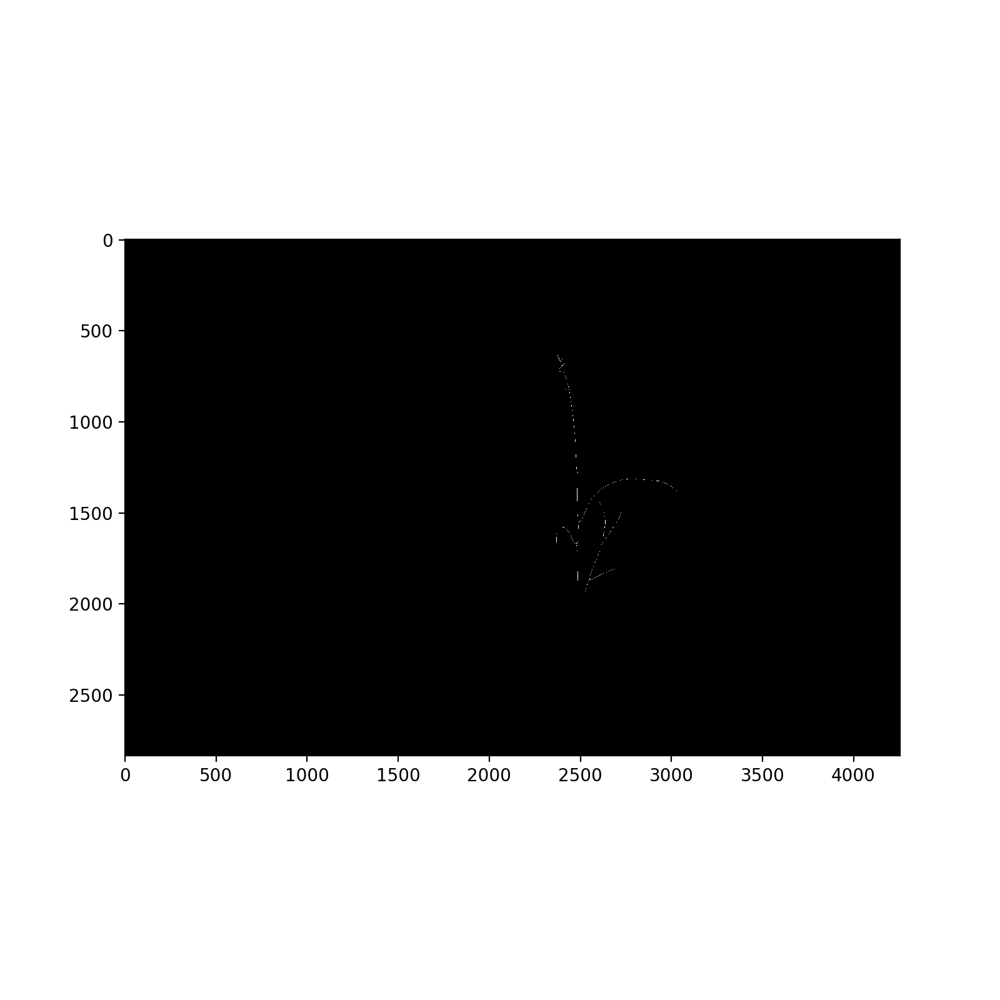

In [132]:
filtered_contours2, filtered_hierarchy2, filtered_mask2, filtered_area2 = pcv.roi_objects(
        img=img, roi_type="partial", roi_contour=rois[1], roi_hierarchy=roi_hierarchies[1], object_contour=obj, 
        obj_hierarchy=obj_hierarchy)
plant_contour2, plant_mask2 = pcv.object_composition(img=img, contours=filtered_contours2, 
                                                     hierarchy=filtered_hierarchy2)        
skel2 = pcv.morphology.skeletonize(mask=filtered_mask2)

<IPython.core.display.Javascript object>


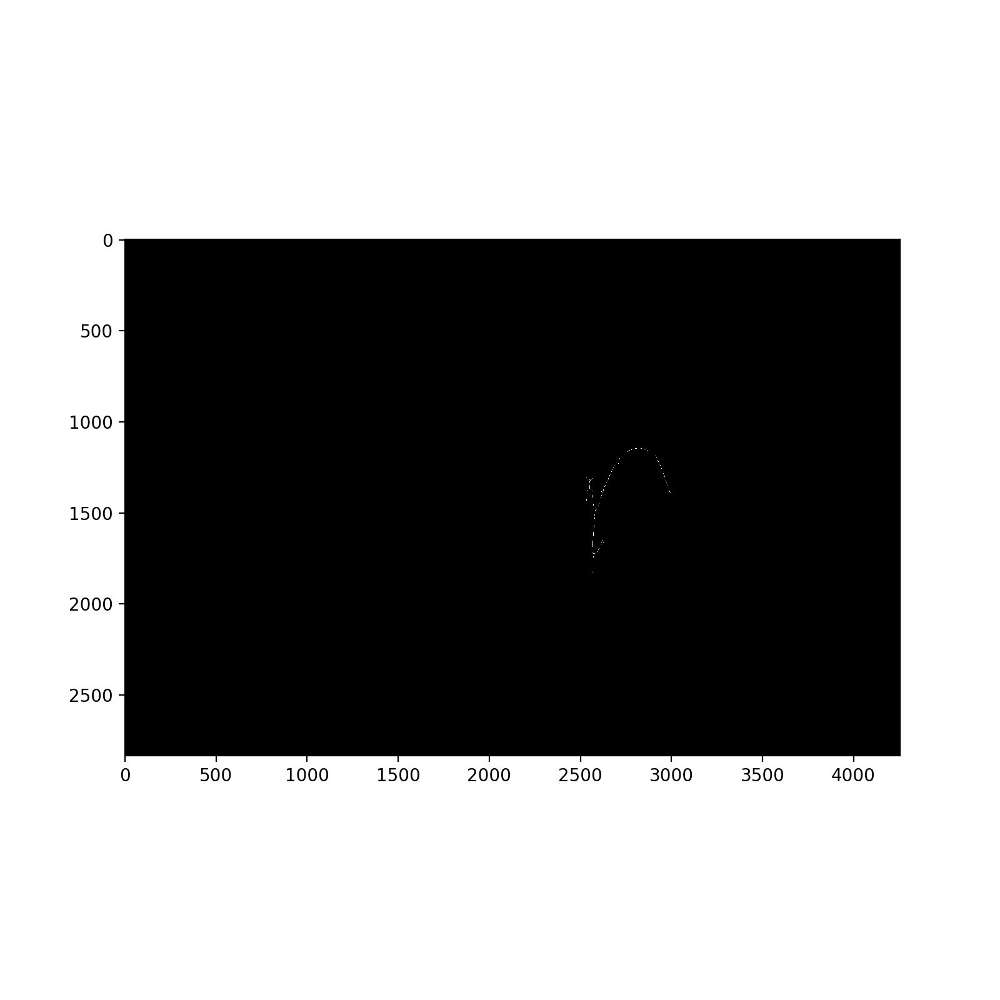

In [118]:
%matplotlib notebook

skel2 = pcv.morphology.skeletonize(mask=filtered_mask2)

<IPython.core.display.Javascript object>


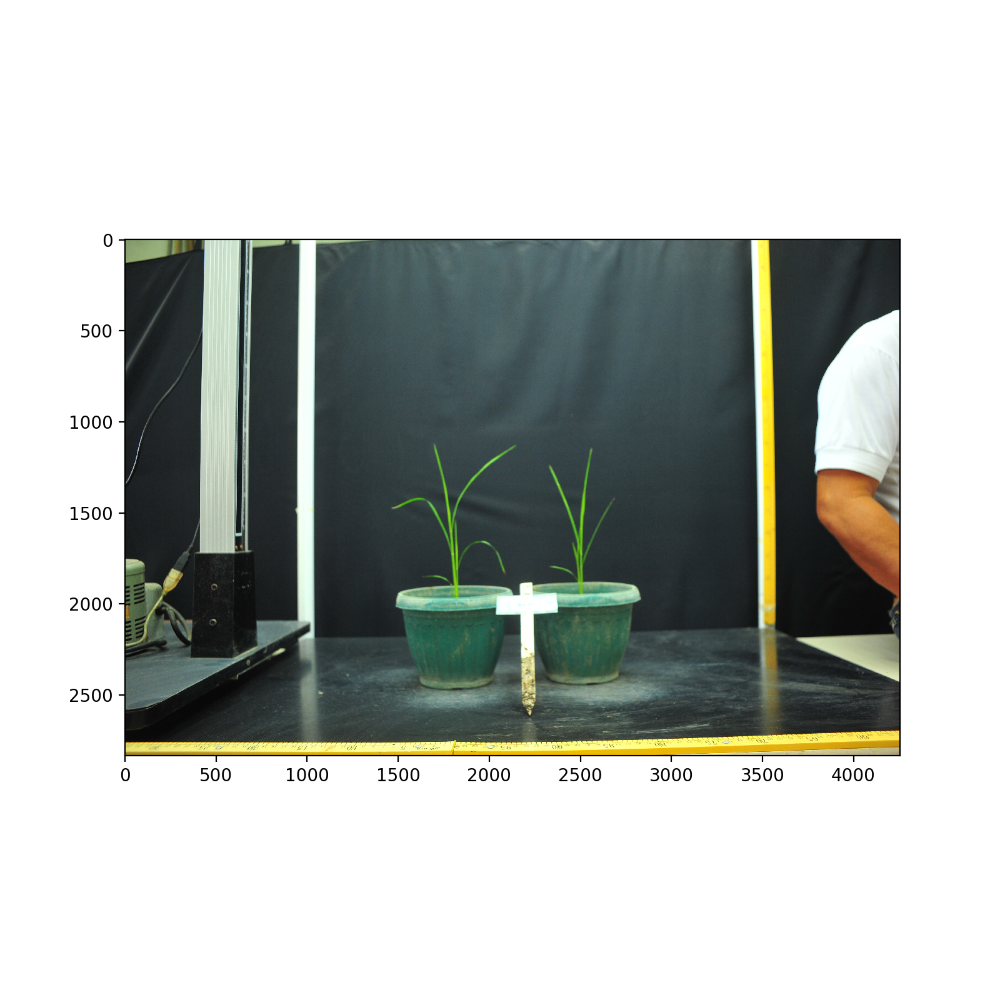

In [133]:
%matplotlib notebook
%matplotlib notebook


pruned2, segmented_img, segment_objects = pcv.morphology.prune(skel2, 40)
pruned2, segmented_img, segment_objects = pcv.morphology.prune(pruned2, 30)


<IPython.core.display.Javascript object>


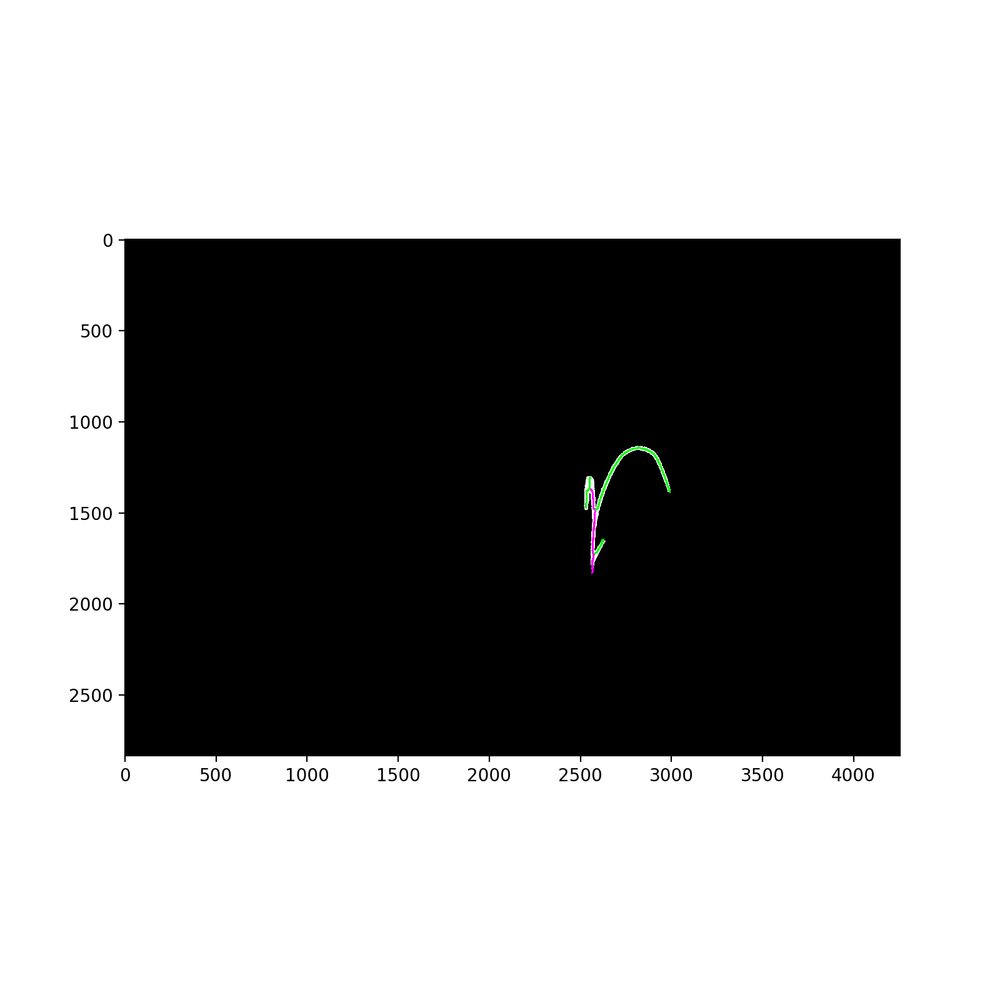

In [120]:
leaf_objects2, other_objects2 = pcv.morphology.segment_sort(skel_img=pruned2, 
                                                            objects=segment_objects, 
                                                            mask=filtered_mask2)

<IPython.core.display.Javascript object>


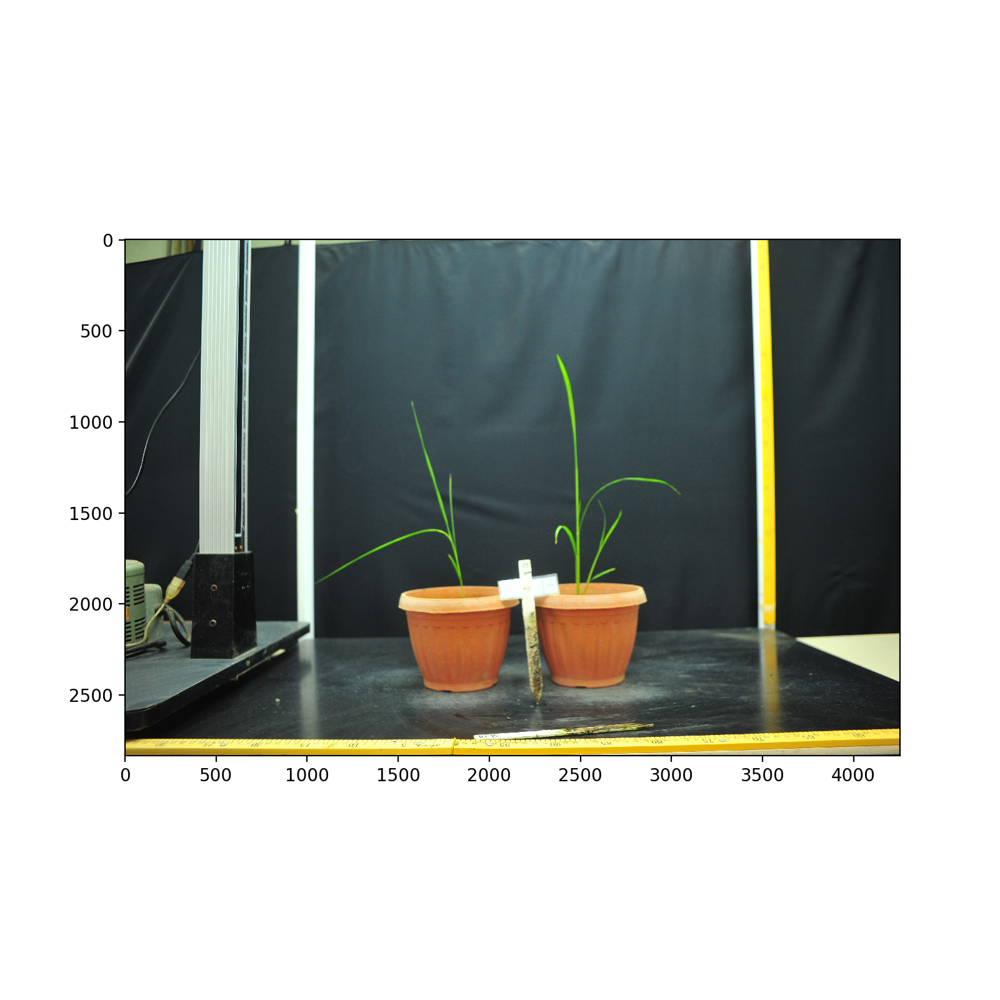

In [121]:
labeled_img = pcv.morphology.segment_path_length(segmented_img=segmented_img, objects=leaf_objects2)


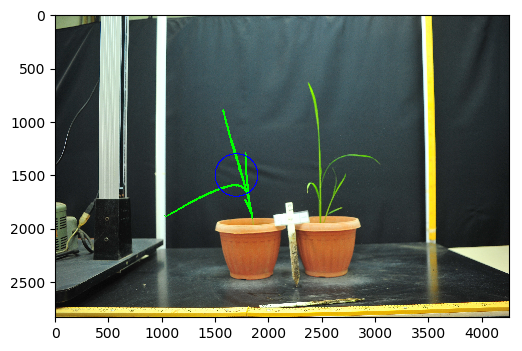

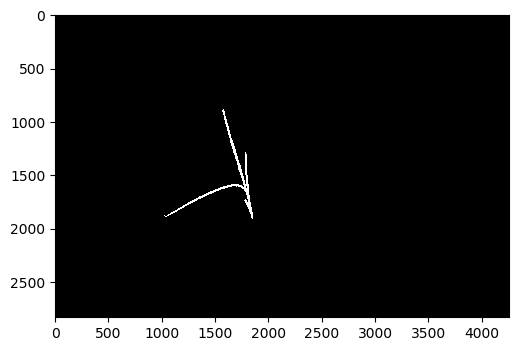

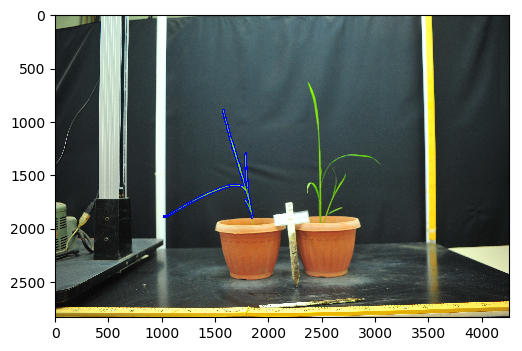

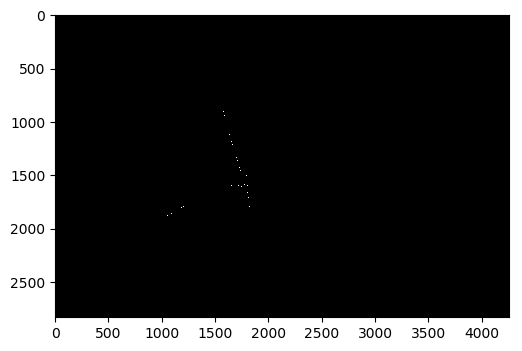

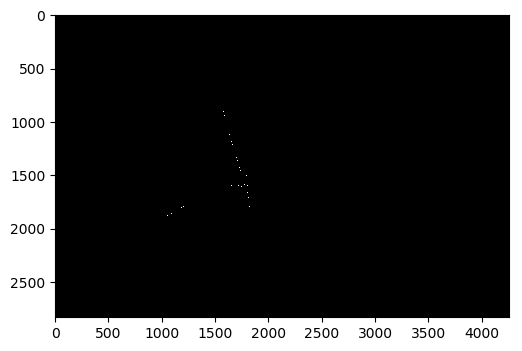

...

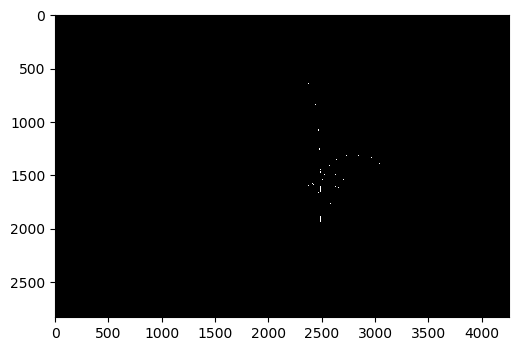

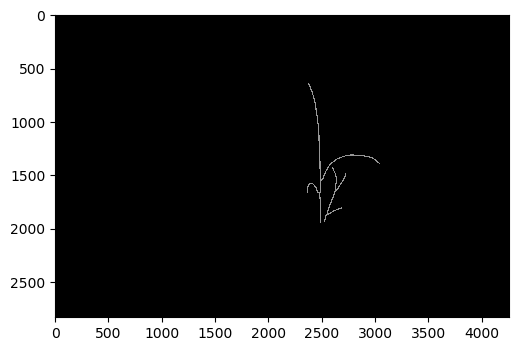

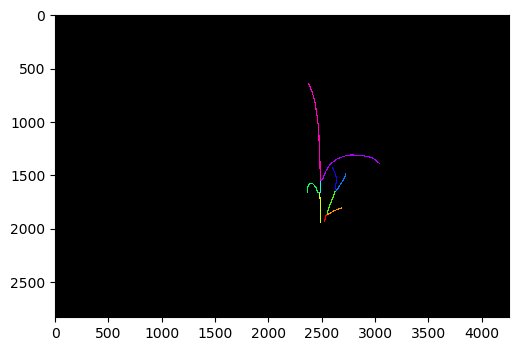

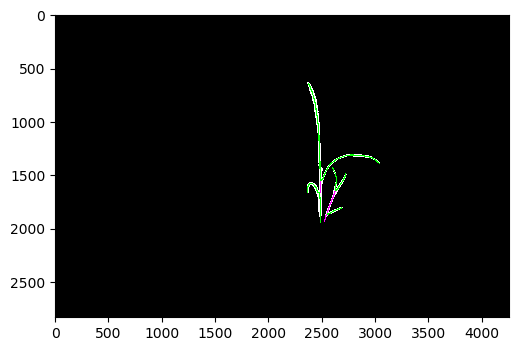

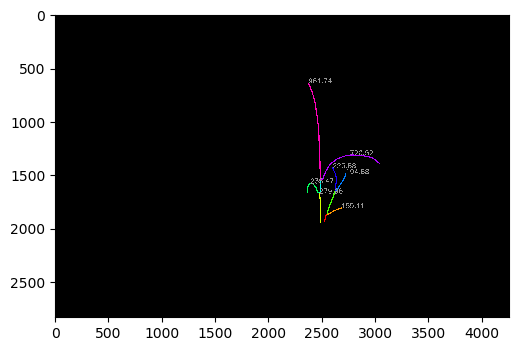

In [52]:
%matplotlib inline 
img_copy = np.copy(img)

for i in range(0, len(rois)):
    # Set the ROI and corresponding hierarcy of interest 
    roi = rois[i]
    hierarchy = roi_hierarchies[i]
    if i == 0:
        plant_label = 'left'
    else: 
        plant_label = 'right'
        
    # Find objects within a region of interest (left plant or right plant)
    filtered_contours, filtered_hierarchy, filtered_mask, filtered_area = pcv.roi_objects(
        img=img, roi_type="partial", roi_contour=roi, roi_hierarchy=hierarchy, object_contour=obj, 
        obj_hierarchy=obj_hierarchy)

    # Combine objects together for downstream analysis
    plant_contour, plant_mask = pcv.object_composition(img=img, contours=filtered_contours, 
                                                       hierarchy=filtered_hierarchy)        
    
    # Setup for segmentation and measurements 
    # Variable must be different for things to get saved separately 
    skel = pcv.morphology.skeletonize(mask=filtered_mask)
    pruned, segmented_img, segment_objects = pcv.morphology.prune(skel_img=skel, size=40)
    pruned, segmented_img, segment_objects = pcv.morphology.prune(skel_img=pruned, size=30)
    leaf_objects, other_objects = pcv.morphology.segment_sort(skel_img=pruned, 
                                                              objects=segment_objects, 
                                                              mask=filtered_mask)
    
    labeled_img = pcv.morphology.segment_path_length(segmented_img=segmented_img,
                                                     objects=leaf_objects)
    leaf_lengths = pcv.outputs.observations['segment_path_length']['value']
    
    # Create data outputs 
    pcv.outputs.add_observation(variable='number_of_leaves_' + plant_label, trait='number_of_leaves',
                                method='plantcv.plantcv.morphology.segment_sort', scale='none', datatype=int,
                                value=len(leaf_lengths), label=plant_label)

    pcv.outputs.add_observation(variable='longest_leaf_length_' + plant_label, trait='longest_leaf_length',
                            method='plantcv.plantcv.morphology.segment_sort', scale='none', datatype=int,
                            value=max(leaf_lengths), label=plant_label)

    # Print out a text file with shape data for each plant in the image 
    pcv.print_results(filename = filename + plant_label + '.txt')


In [56]:
pcv.outputs.observations['number_of_leavesleft']['value']

4